<center>

# Group Assignment I

<center>

<center>

Ibadat Jarg, Emily Zhao, Xiao Xu

<center>

In [9]:
#Loading Relevant libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
#%pip install ucimlrepo #installing the ucimlrepo package to load the dataset


## Question 1 – Communities & Crime

For this question you will use the “Communities & Crime” dataset found at the UCI repository
(here). Your goal is to develop a model that best predicts “ViolentCrimesPerPop”.

https://archive.ics.uci.edu/dataset/183/communities+and+crime

### Task A: Dataset Curation and Preprocessing

#### 1.
Thoroughly examine the dataset. Familiarize yourselves with the 3 data origins. Be aware
of potential limitations and/or biases. Discuss any potential shortcomings you may have
detected.

In [15]:
#Importing the data into the notebook
! pip install ucimlrepo
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
communities_and_crime = fetch_ucirepo(id=183) 

# variable information 
print(communities_and_crime.variables) 


                    name     role         type demographic description units  \
0                  state  Feature      Integer        None        None  None   
1                 county  Feature      Integer        None        None  None   
2              community  Feature      Integer        None        None  None   
3          communityname  Feature  Categorical        None        None  None   
4                   fold  Feature      Integer        None        None  None   
..                   ...      ...          ...         ...         ...   ...   
123  LemasPctPolicOnPatr  Feature   Continuous        None        None  None   
124  LemasGangUnitDeploy  Feature      Integer        None        None  None   
125  LemasPctOfficDrugUn  Feature      Integer        None        None  None   
126      PolicBudgPerPop  Feature      Integer        None        None  None   
127  ViolentCrimesPerPop   Target   Continuous        None        None  None   

    missing_values  
0               no

In [17]:
# Check the type of communities_and_crime
type(communities_and_crime)

# Converting the data into a pandas dataframe
df = pd.DataFrame(data=communities_and_crime.data['features'], columns=communities_and_crime.variables['name'])

# Adding ViolentCrimesPerPop to the dataframe
df['ViolentCrimesPerPop'] = communities_and_crime.data['targets']


In [19]:
#converting all '?' to NaN
df.replace('?', np.nan, inplace=True)

In [21]:
#seeing our datset
df

name,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,...,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,...,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,...,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.20,NaN,NaN,NaN,NaN,0.00,NaN,0.45
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19


 
Ans:

The Dataset has over 122 features that are used to predict Violent Crimes per capita (Target Variable). It contains a wide range of demographic varibales that range from, income, race, arests and indcidences of crime. 

The data is collected from Law enforecement management and Administrative statistics survey 1990, Us census data from 1990 and FBI Uniform Crime reporting statistics from 1995. These there 3 data origins have been combined to create a data set that is aimed at prediciting our target variable.

A limitation of the data that is mentioned on the the UCI website is that the LEMAS survey only included police departments with atleast 100 officers and a random sample of smaller departments. This posses a few problems, first since we are systematically reducing the number of smaller polie department in our dataset we have also created a built in bias in our dataset. Smaller police departmens would likely represent smaller and more rural areas, thus over representing urbanized areas in the dataset. 

Another limitaiton of the dataset is that there is a discrepency in dates from which the the data has been collected from, the LEMAS survey and Census data is from 1990, whereas the FBI crime stats are from 1995. This has the portnetial of introducing bias thorugh measurement error, since crime the demographics of 1990 may not be pertinent to crime in 1995. 

The preprocessing steps taken in the dataset could also be problematic as the normalization for the numeric values does not translate into in group comparisons: "the normalization does not preserve relationships between values BETWEEN attributes (e.g. it would not be meaningful to compare the value for whitePerCap with the value for blackPerCap for a community) " 


#### 2.
Implement and explain the preprocessing steps needed for this dataset, including handling
missing values, outlier detection and treatment, and feature scaling (if necessary), among any
additional preprocessing step you deem fit. Justify your choices.

Ans:

The data has already taken some steps towards preporcessing by normalizing all numeric values in range form [0.00-1.00]. They also note that any value more than 3 standard deviations away from the mean have be normalised to 0 or 1, by doing this they have also minimised the effect of outliers in the numeric variables in the data set. As noted above normalization does not led it self to in group comparisons but for our task that is not required. 


In [23]:
# seeing all our numerical columns
df.describe()

name,state,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,...,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
count,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,...,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000
mean,28.683551,5.493982,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,...,0.215552,0.608892,0.535050,0.626424,0.651530,0.065231,0.232854,0.161685,0.094052,0.237979
std,16.397553,2.873694,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,...,0.231134,0.204329,0.181352,0.200521,0.198221,0.109459,0.203092,0.229055,0.240328,0.232985
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12.000000,3.000000,0.010000,0.350000,0.020000,0.630000,0.040000,0.010000,0.340000,0.410000,...,0.060000,0.470000,0.420000,0.520000,0.560000,0.020000,0.100000,0.020000,0.000000,0.070000
50%,34.000000,5.000000,0.020000,0.440000,0.060000,0.850000,0.070000,0.040000,0.400000,0.480000,...,0.130000,0.630000,0.540000,0.670000,0.700000,0.040000,0.170000,0.070000,0.000000,0.150000
75%,42.000000,8.000000,0.050000,0.540000,0.230000,0.940000,0.170000,0.160000,0.470000,0.540000,...,0.280000,0.777500,0.660000,0.770000,0.790000,0.070000,0.280000,0.190000,0.000000,0.330000
max,56.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [25]:
# We see that state and fold are the only numerical columns with ranges not in 0-1 and we can drop them
# can be removed as they are not useful for our analysis
df.drop(['state', 'fold'], axis=1, inplace=True)

In [27]:
# Also dropping county and community name as they are not useful for our analysis
df.drop(['county', 'community', 'communityname'], axis=1, inplace=True)

In [29]:
#Displaying feature with missing values
feat_miss = df.columns[df.isnull().any()]

#Seeing feature that have missing values
print(feat_miss)
feat_miss.shape

Index(['OtherPerCap', 'LemasSwornFT', 'LemasSwFTPerPop', 'LemasSwFTFieldOps',
       'LemasSwFTFieldPerPop', 'LemasTotalReq', 'LemasTotReqPerPop',
       'PolicReqPerOffic', 'PolicPerPop', 'RacialMatchCommPol',
       'PctPolicWhite', 'PctPolicBlack', 'PctPolicHisp', 'PctPolicAsian',
       'PctPolicMinor', 'OfficAssgnDrugUnits', 'NumKindsDrugsSeiz',
       'PolicAveOTWorked', 'PolicCars', 'PolicOperBudg', 'LemasPctPolicOnPatr',
       'LemasGangUnitDeploy', 'PolicBudgPerPop'],
      dtype='object', name='name')


(23,)

In [31]:
# Seeing the description of the features with missing values
df[feat_miss[0:11]].describe()

name,OtherPerCap,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite
count,1993,319,319,319,319,319,319,319,319,319,319
unique,97,38,52,34,55,44,59,75,52,76,74
top,0,0.02,0.1,0.98,0.19,0.02,0.14,0.23,0.1,0.78,0.72
freq,129,80,19,81,17,55,23,15,19,12,11


In [33]:
df[feat_miss[12:23]].describe()

name,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,PolicBudgPerPop
count,319,319,319,319,319,319,319,319,319,319,319
unique,54,50,72,30,15,77,63,38,72,3,51
top,0,0,0.07,0.03,0.57,0.19,0.02,0.02,0.74,0,0.12
freq,72,189,14,48,54,12,27,69,13,126,22


In [35]:
# Using iterative imputer to fill in the missing values
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer 

imputer = IterativeImputer()
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns) #New dataframe with imputed values


/opt/anaconda3/lib/python3.12/site-packages/sklearn/impute/_iterative.py:801: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [37]:
#seeing if missing values have been filled
print(len(df_imputed.columns[df_imputed.isnull().any()]))
#they have indeed been filled

0


#### 3.
Perform feature engineering to create at least 3 new features and justify their potential impact
on a regression model’s performance. (Feel free to create polynomials and/or interaction
terms, as long as you justify your choices.)

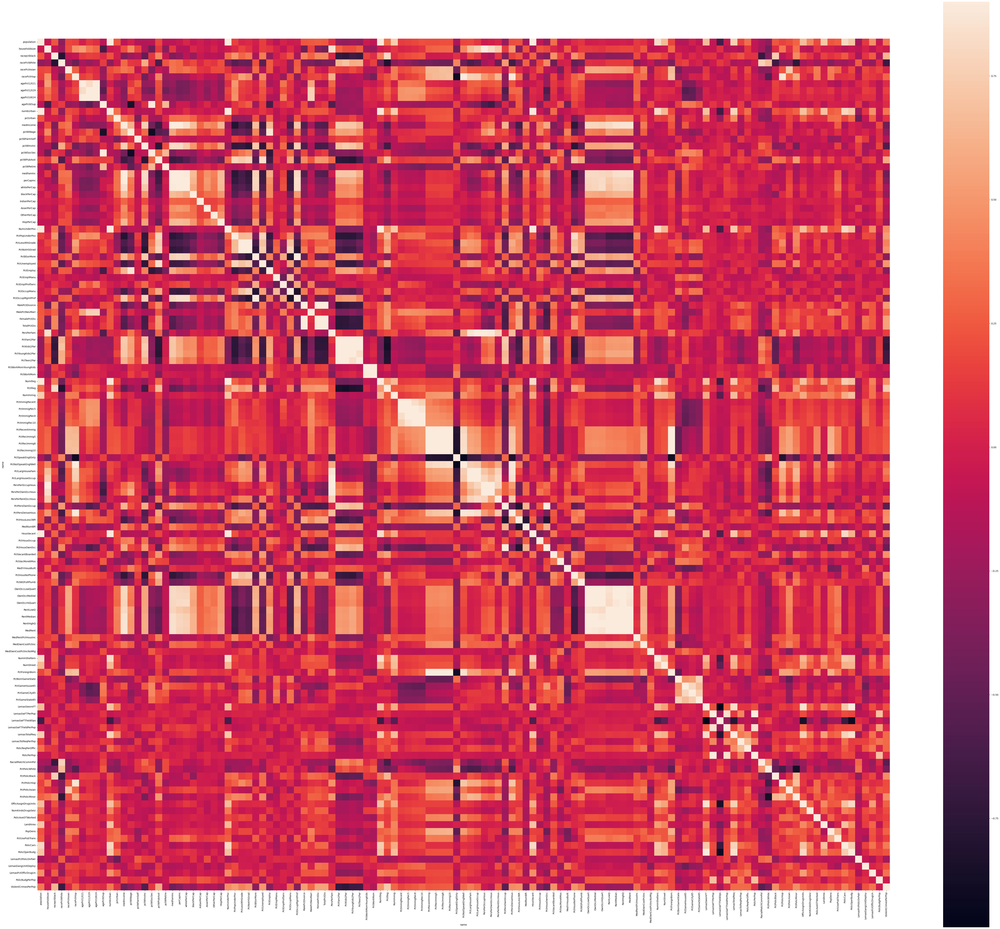

In [39]:
# Seeing the correlation of the features with the target variable
corrmat = df_imputed.corr()
fig = plt.figure(figsize = (80, 70))


sns.heatmap(corrmat, vmax = .9, square = True)
plt.show()

In [41]:
# Seeing the correlation of the features with target variable
corrmat

name,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
name,,,,,,,,,,,,,,,,,,,,,
population,1.000000,-0.046148,0.231178,-0.300845,0.181603,0.156218,0.006368,0.130344,0.075596,-0.102006,...,0.713652,0.231897,0.270356,0.803467,0.709977,-0.207835,0.120412,0.466352,-0.047412,0.367157
householdsize,-0.046148,1.000000,-0.067109,-0.235907,0.201996,0.468659,0.520461,0.367338,0.295225,-0.612666,...,-0.015078,-0.004072,-0.051506,-0.127286,-0.064095,-0.101341,0.021365,-0.094368,0.018944,-0.034923
racepctblack,0.231178,-0.067109,1.000000,-0.794389,-0.106738,-0.066581,0.122338,0.153475,0.134068,0.052934,...,0.149758,0.095053,0.147023,0.245012,0.060506,-0.190324,0.107366,0.260793,-0.145613,0.631264
racePctWhite,-0.300845,-0.235907,-0.794389,1.000000,-0.270266,-0.444166,-0.194015,-0.266852,-0.183804,0.136483,...,-0.131389,-0.337458,-0.215636,-0.236066,-0.151720,0.265475,-0.216157,-0.276234,0.055761,-0.684770
racePctAsian,0.181603,0.201996,-0.106738,-0.270266,1.000000,0.266743,-0.025020,0.100727,0.052761,-0.272020,...,-0.001084,0.389944,0.296921,0.016369,0.189916,-0.178947,0.187486,0.101888,0.169927,0.037622
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
LemasPctPolicOnPatr,-0.207835,-0.101341,-0.190324,0.265475,-0.178947,-0.113583,0.050978,-0.015141,0.042571,0.128695,...,-0.133112,-0.107826,-0.104642,-0.167640,-0.205592,1.000000,-0.058928,-0.172838,0.028745,-0.206259
LemasGangUnitDeploy,0.120412,0.021365,0.107366,-0.216157,0.187486,0.167158,0.098442,0.143929,0.091890,-0.163581,...,0.139925,-0.099591,-0.206435,0.166753,0.035585,-0.058928,1.000000,0.023524,0.086652,0.225883
LemasPctOfficDrugUn,0.466352,-0.094368,0.260793,-0.276234,0.101888,0.125353,0.001301,0.117290,0.083180,-0.010168,...,0.299632,0.228084,0.206644,0.345127,0.202128,-0.172838,0.023524,1.000000,-0.033474,0.348627


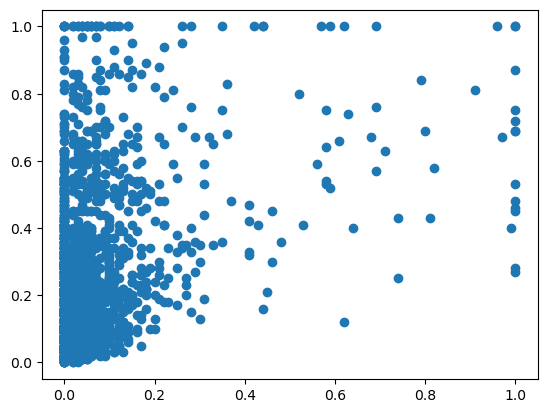

In [43]:
# We will make a new feature numUrbanSq which is the square of numbUrban
df_imputed['numUrbanSq'] = df_imputed['numbUrban']**2

#plotting population and ViolentCrimesPerPop
plt.scatter(df_imputed['numbUrban'], df_imputed['ViolentCrimesPerPop'])

# We are doing this becasue we see that the relationship between the two is not linear
# NOTE: since we are using normalzed values within group comparisions are hard to do

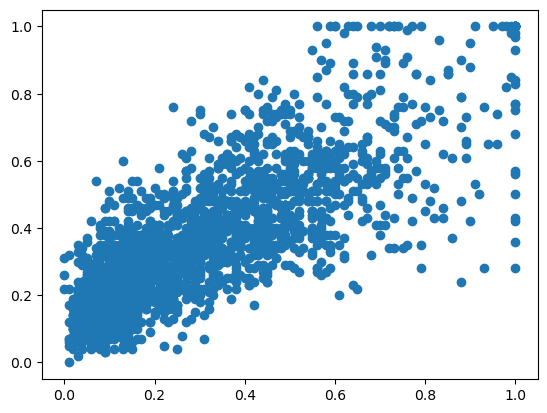

In [45]:
# Interaction term between 'PctPopUnderPov' and 'PctUnemployed'
df_imputed['Pov_Unemp_Interaction'] = df_imputed['PctPopUnderPov'] * df_imputed['PctUnemployed']

# We will plot PctPopUnderPov and PctUnemployed
plt.scatter(df_imputed['PctPopUnderPov'], df_imputed['PctUnemployed'])

#Since they are reasonably highly correlated we can create an interaction term

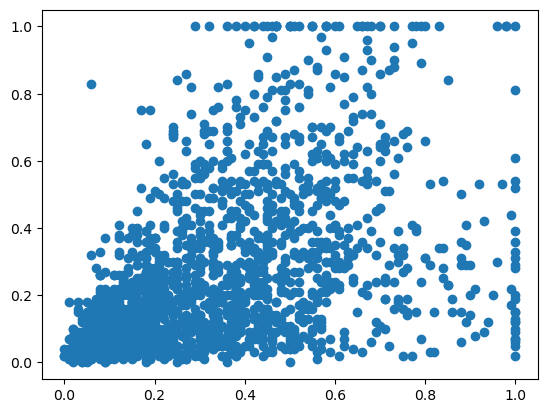

In [47]:
# We will make a new feature pctUnderPovSq which is the square of PctPopUnderPov
df_imputed['pctUnderPovSq'] = df_imputed['PctPopUnderPov']**2

# Plotting PctPopUnderPov and ViolentCrimesPerPop
plt.scatter(df_imputed['PctPopUnderPov'], df_imputed['ViolentCrimesPerPop'])

#We see there is a large outlier of high poverty areas with lower violent crimes per population, thus we should model this non-linearly

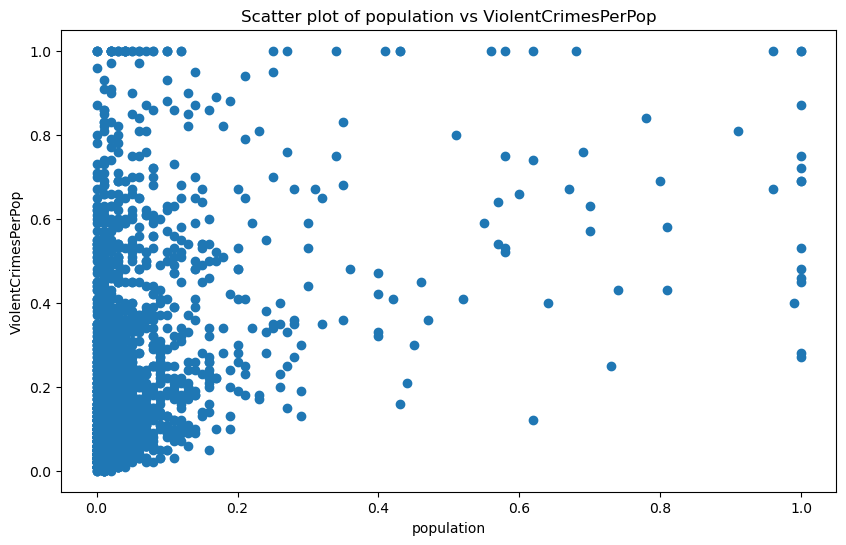

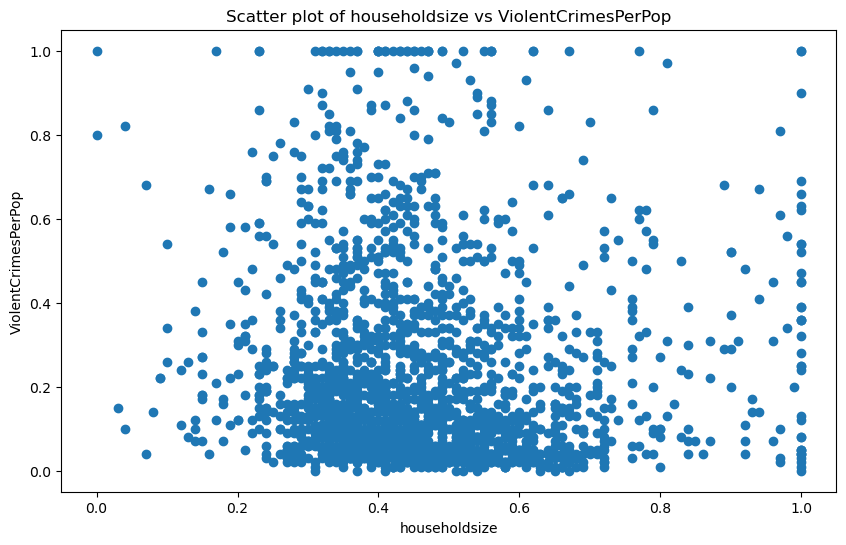

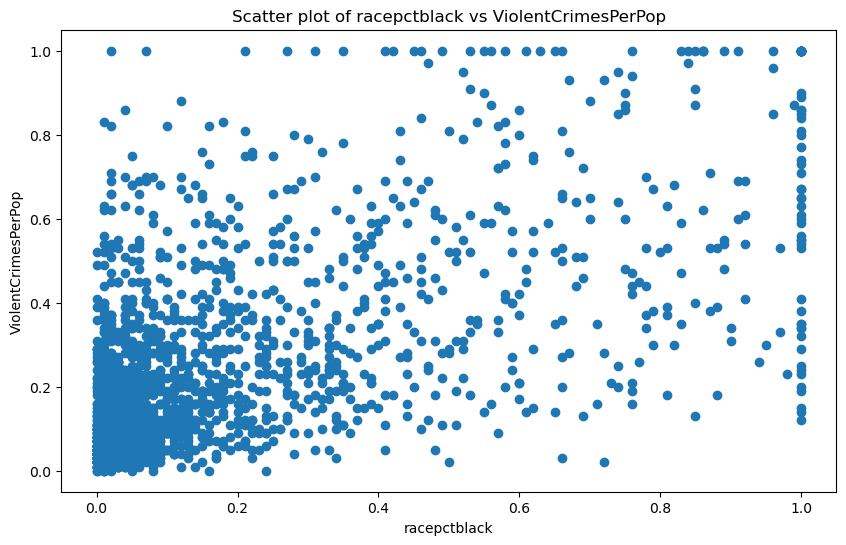

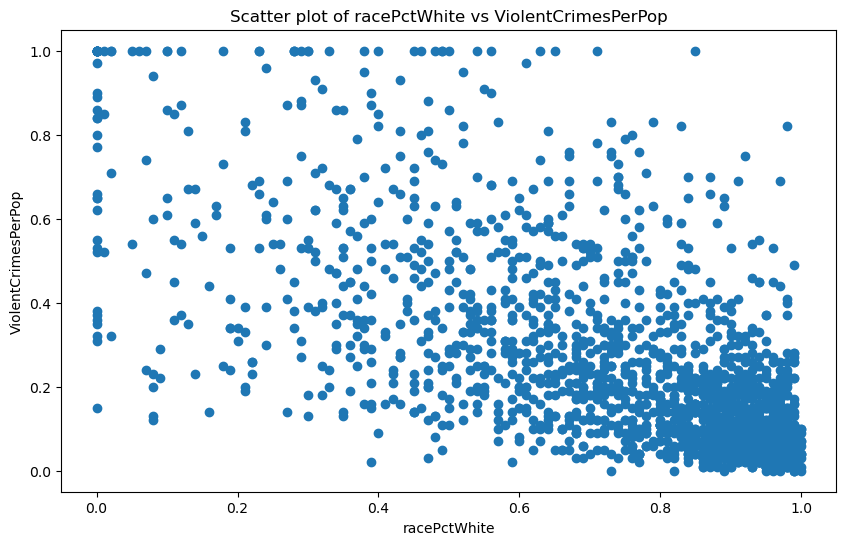

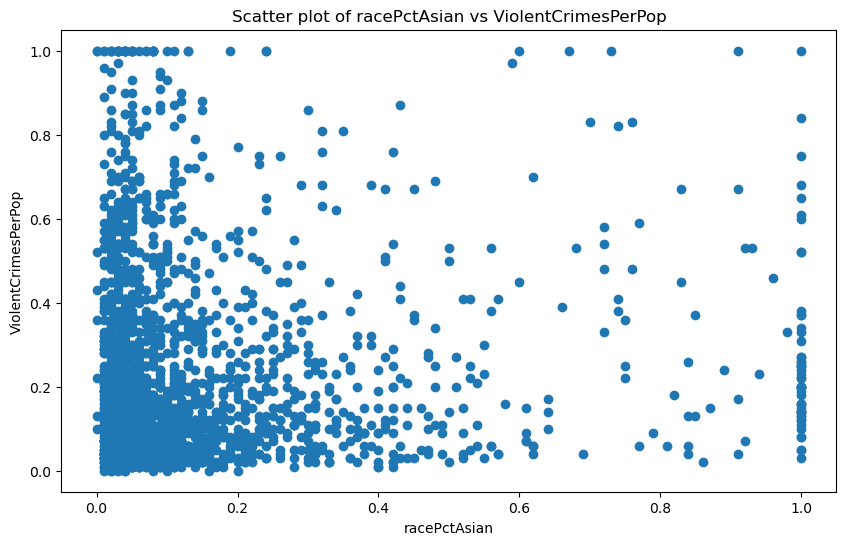

...

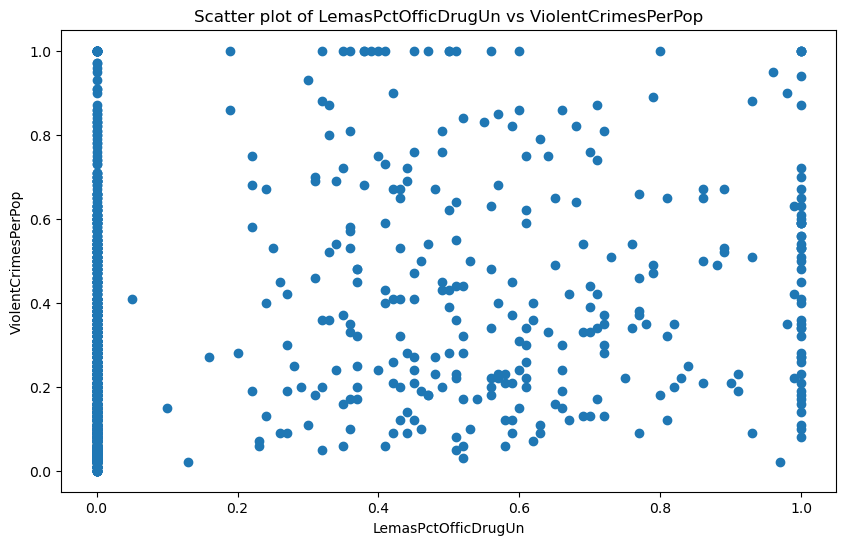

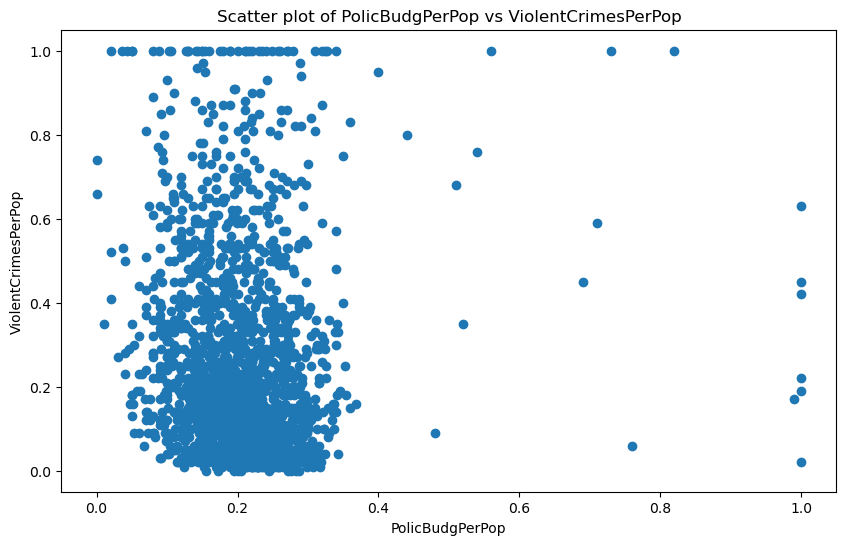

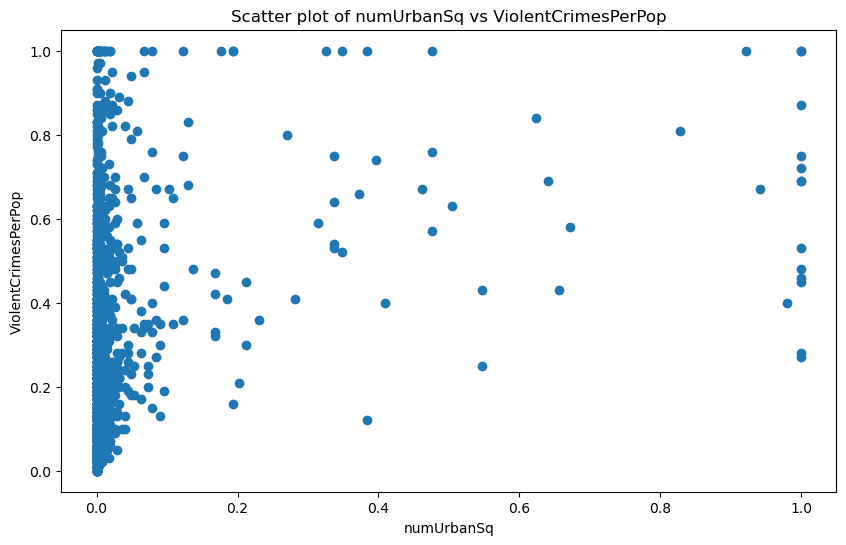

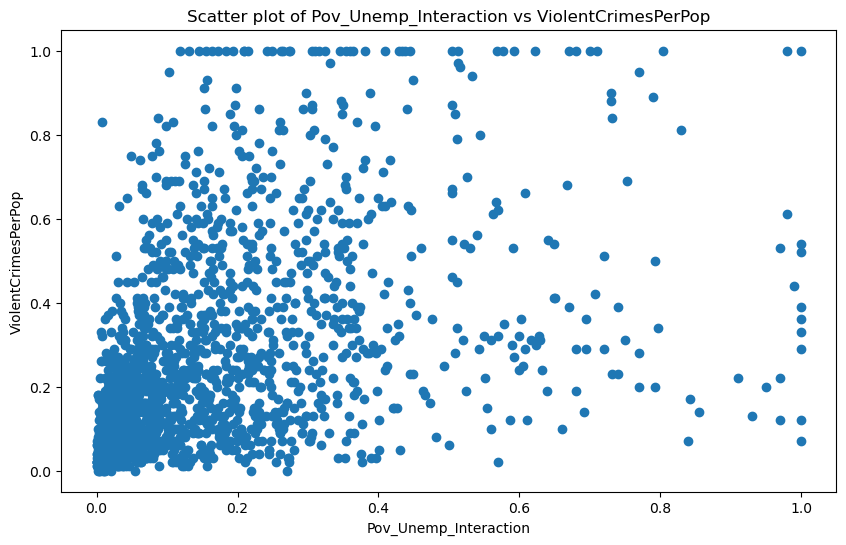

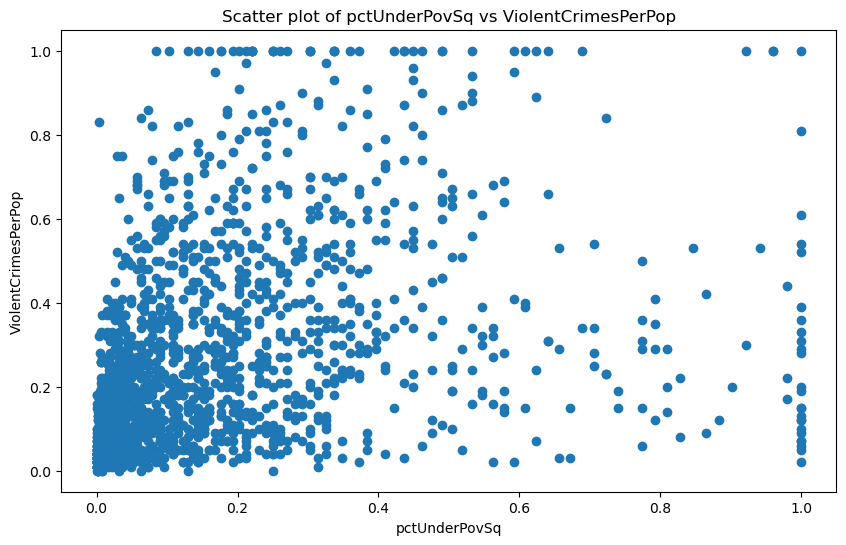

In [49]:
#DO NOT RUN THIS CELL UNLESS YOU LIKE GRAPHS
# Scatter plots for each feature against the target variable
for column in df_imputed.columns:
    if column != 'ViolentCrimesPerPop':
        plt.figure(figsize=(10, 6))
        plt.scatter(df_imputed[column], df_imputed['ViolentCrimesPerPop'])
        plt.xlabel(column)
        plt.ylabel('ViolentCrimesPerPop')
        plt.title(f'Scatter plot of {column} vs ViolentCrimesPerPop')
        plt.show()


#### 4.
Curate the processed data to the best of your abilities. Include graphs, plots, and descriptive
stats. Assume that your audience is highly technical and possesses domain knowledge.

In [50]:
#
df_imputed.describe()

name,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,...,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop,numUrbanSq,Pov_Unemp_Interaction,pctUnderPovSq
count,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,...,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000
mean,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,...,0.059416,0.032874,0.796270,0.422491,0.094052,0.205281,0.237979,0.020547,0.145994,0.143998
std,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,...,0.104601,0.067547,0.210825,0.190458,0.240328,0.082684,0.232985,0.104364,0.176359,0.196812
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-0.072184,-0.116616,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.010000,0.350000,0.020000,0.630000,0.040000,0.010000,0.340000,0.410000,0.250000,0.300000,...,0.016249,0.005978,0.670000,0.332021,0.000000,0.160096,0.070000,0.000000,0.023100,0.012100
50%,0.020000,0.440000,0.060000,0.850000,0.070000,0.040000,0.400000,0.480000,0.290000,0.420000,...,0.041136,0.026923,0.794570,0.433725,0.000000,0.202432,0.150000,0.000900,0.076900,0.062500
75%,0.050000,0.540000,0.230000,0.940000,0.170000,0.160000,0.470000,0.540000,0.360000,0.530000,...,0.069944,0.049565,0.929736,0.504989,0.000000,0.241738,0.330000,0.004900,0.208000,0.202500
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.562747,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### Task B: Regression Model Development and Evaluation


#### 1. 
Choose a model suitable for the dataset and task (remember: the initial goal is to predict
“ViolentCrimesPerPop”). Justify your selection based on the characteristics of the data and
your theoretical insights. Experiment with different model specifications. Choose one that is
best suited for your goal. Explain your selection in detail. (Tip: you might need to consider
including regularization functions.)



Answer: A regularized linear regression model is the most suitable choice for predicting “ViolentCrimesPerPop” from the Communities & Crime dataset. The data contains many demographic, economic, and policing variables that can be correlated, leading to overfitting if a standard linear regression is used. LASSO (L1), Ridge (L2), or Elastic Net introduces a penalty on the model’s coefficients, controlling variance, stabilizing parameter estimates under multicollinearity, and reducing overfitting while preserving interpretability through explicit coefficients. To implement this approach, one begins with a baseline Ordinary Least Squares regression to observe how high dimensionality may inflate coefficients or degrade generalization, then tests LASSO to see if its zeroing out of marginal predictors leads to simpler, effective models. If discarding correlated features becomes problematic, Ridge can be used to retain them while shrinking large coefficients, and Elastic Net combines both L1 and L2 advantages if necessary. Model selection relies on cross-validation and tuning the penalty hyperparameter (alpha) or, for Elastic Net, its l1_ratio as well. The final choice is guided by minimizing errors (for instance, RMSE) and maximizing interpretability of coefficients, which is valuable in a policymaking or community context.

In [55]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import Lasso, Ridge, ElasticNet
from sklearn.metrics import mean_squared_error, r2_score

# "ViolentCrimesPerPop" serving as the target
target = "ViolentCrimesPerPop"

# Separate features (X) and target (y)
X = df_imputed.drop(columns=[target])
y = df_imputed[target]

# Split data into train (70%) and test (30%) sets, fix random_state for reproducibility
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42
)

In [57]:
# LASSO REGRESSION
# Define a grid of alpha values to explore
param_grid = {"alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10]}

# Initialize Lasso model (increase max_iter if convergence warnings occur)
lasso = GridSearchCV(
    estimator=Lasso(max_iter=5000),
    param_grid=param_grid,
    scoring="neg_mean_squared_error",  # Evaluate by minimizing MSE
    cv=5  # 5-fold cross-validation
)

# Fit Lasso on training data
lasso.fit(X_train, y_train)

# Extract the best estimator and evaluate on test data
lasso_best = lasso.best_estimator_
y_pred_lasso = lasso_best.predict(X_test)
print("LASSO best alpha:", lasso.best_params_)
print("LASSO RMSE:", mean_squared_error(y_test, y_pred_lasso, squared=False))
print("LASSO R^2:", r2_score(y_test, y_pred_lasso))

LASSO best alpha: {'alpha': 0.0001}
LASSO RMSE: 0.11810897044084243
LASSO R^2: 0.7086508323598422


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [59]:
# RIDGE REGRESSION
# Use the same param grid for alpha as Lasso
ridge = GridSearchCV(
    estimator=Ridge(max_iter=5000),
    param_grid=param_grid,
    scoring="neg_mean_squared_error",
    cv=5
)

# Fit Ridge on training data
ridge.fit(X_train, y_train)

# Evaluate best Ridge model on test data
ridge_best = ridge.best_estimator_
y_pred_ridge = ridge_best.predict(X_test)
print("Ridge best alpha:", ridge.best_params_)
print("Ridge RMSE:", mean_squared_error(y_test, y_pred_ridge, squared=False))
print("Ridge R^2:", r2_score(y_test, y_pred_ridge))


Ridge best alpha: {'alpha': 1}
Ridge RMSE: 0.11891637544746604
Ridge R^2: 0.7046538315040347


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [61]:
# ELASTIC NET
# For Elastic Net, we tune both alpha (strength of penalty) and l1_ratio (balance of L1 vs. L2)
enet_params = {
    "alpha": [0.0001, 0.001, 0.01, 0.1, 1, 10],
    "l1_ratio": [0.1, 0.5, 0.9]
}

# Initialize Elastic Net with a GridSearch
enet = GridSearchCV(
    estimator=ElasticNet(max_iter=5000),
    param_grid=enet_params,
    scoring="neg_mean_squared_error",
    cv=5
)

# Fit Elastic Net on training data
enet.fit(X_train, y_train)

# Evaluate best Elastic Net model on test data
enet_best = enet.best_estimator_
y_pred_enet = enet_best.predict(X_test)
print("Elastic Net best params:", enet.best_params_)
print("Elastic Net RMSE:", mean_squared_error(y_test, y_pred_enet, squared=False))
print("Elastic Net R^2:", r2_score(y_test, y_pred_enet))

Elastic Net best params: {'alpha': 0.0001, 'l1_ratio': 0.9}
Elastic Net RMSE: 0.11796529361838103
Elastic Net R^2: 0.709359240223244


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


After splitting the data into training and test sets, we ran cross-validation to find the best penalty parameters for each method. Elastic Net with alpha = 0.0001 and l1_ratio = 0.9 stood out, with an RMSE of about 0.118 and R² around 0.709 on our test set, slightly outperforming the other two. This means the model handles correlated demographic and policing variables without discarding useful information, yet still weeds out the least relevant features. In the context of our project—where we want both accuracy and insight into which factors drive violent crime—this approach offers a clear balance. It reduces overfitting by penalizing large coefficients, preserves interpretability so we can identify top predictors, and proves more robust than a standard linear regression in dealing with our high-dimensional dataset.


#### 2. 
Discreticize the target as you see fit (either binary or trichotomous). Justify your decision.
Fit at least two distinct classifiers. Choose the one that performs, in your opinion, best on
these data.



Answer: I decided to divide ViolentCrimesPerPop into three categories—Low, Medium, and High—to capture a broader range of violent crime levels than a simple binary cutoff could. Because the data is already scaled between 0 and 1, I used quantiles to separate the distribution of violent crime rates: Low for values below the 33rd percentile, Medium between the 33rd and 66th percentiles, and High above the 66th percentile. This approach ensures a roughly balanced set of observations in each category while preserving differences in community crime severity.

In [65]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, classification_report

# Create the discrete target with Low, Medium, High categories.
q33 = df_imputed["ViolentCrimesPerPop"].quantile(0.33)
q66 = df_imputed["ViolentCrimesPerPop"].quantile(0.66)

def categorize_crime(val):
    if val <= q33:
        return 0  # Low
    elif val <= q66:
        return 1  # Medium
    else:
        return 2  # High

df_imputed["CrimeCategory"] = df_imputed["ViolentCrimesPerPop"].apply(categorize_crime)
df_discrete = df_imputed.drop(columns=["ViolentCrimesPerPop"])

X = df_discrete.drop(columns=["CrimeCategory"])
y = df_discrete["CrimeCategory"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

In [67]:
# Fit a multinomial Logistic Regression.
logreg = LogisticRegression(multi_class="multinomial", solver="lbfgs", max_iter=1000)
logreg.fit(X_train, y_train)
y_pred_log = logreg.predict(X_test)

print("=== Multinomial Logistic Regression ===")
print(confusion_matrix(y_test, y_pred_log))
print(classification_report(y_test, y_pred_log))


=== Multinomial Logistic Regression ===
[[169  34   1]
 [ 58  97  44]
 [  5  35 156]]
              precision    recall  f1-score   support

           0       0.73      0.83      0.78       204
           1       0.58      0.49      0.53       199
           2       0.78      0.80      0.79       196

    accuracy                           0.70       599
   macro avg       0.70      0.70      0.70       599
weighted avg       0.70      0.70      0.70       599



In [69]:
# Fit a Random Forest classifier.
rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

print("=== Random Forest ===")
print(confusion_matrix(y_test, y_pred_rf))
print(classification_report(y_test, y_pred_rf))

=== Random Forest ===
[[165  38   1]
 [ 56  95  48]
 [  5  38 153]]
              precision    recall  f1-score   support

           0       0.73      0.81      0.77       204
           1       0.56      0.48      0.51       199
           2       0.76      0.78      0.77       196

    accuracy                           0.69       599
   macro avg       0.68      0.69      0.68       599
weighted avg       0.68      0.69      0.68       599



After creating the categories, we fitted two distinct classifiers on the resulting trichotomous target: multinomial Logistic Regression and a Random Forest. The logistic model ended up with slightly higher accuracy (70%) than the Random Forest (69%), and its class-by-class metrics (precision, recall, and F1-scores) were marginally stronger. Because of this and its transparency—each coefficient offers a direct view of how predictors shift odds across Low, Medium, or High violent crime rates—we chose multinomial Logistic Regression as the best model for these data. If we pursued further hyperparameter tuning or explored alternative splits, the Random Forest might improve, but under our current setup, the logistic model’s combination of accuracy and interpretability made it the standout performer.


#### 3. 
Implement the selected regression and classification models, and perform any necessary hyper-
parameter tuning. Discuss the tuning process and its impact on model performance. Assess
your models’ overall performance.


In [72]:
# REGRESSION for Elastic Net

df_reg = df_imputed.copy()  # DataFrame with all numeric variables + continuous ViolentCrimesPerPop

X_reg = df_reg.drop(columns=["ViolentCrimesPerPop"])
y_reg = df_reg["ViolentCrimesPerPop"]

X_train_r, X_test_r, y_train_r, y_test_r = train_test_split(
    X_reg, y_reg, test_size=0.3, random_state=42
)

enet_params = {
    "alpha": [0.0001, 0.001, 0.01, 0.1, 1],
    "l1_ratio": [0.2, 0.5, 0.8, 0.9]
}

enet_grid = GridSearchCV(
    estimator=ElasticNet(max_iter=5000, random_state=42),
    param_grid=enet_params,
    scoring="neg_mean_squared_error",
    cv=5,
    n_jobs=-1
)

enet_grid.fit(X_train_r, y_train_r)
best_enet = enet_grid.best_estimator_

print("Best Elastic Net params:", enet_grid.best_params_)
y_pred_enet = best_enet.predict(X_test_r)
enet_rmse = mean_squared_error(y_test_r, y_pred_enet, squared=False)
enet_r2 = r2_score(y_test_r, y_pred_enet)

print("Elastic Net RMSE:", enet_rmse)
print("Elastic Net R^2:", enet_r2)


Best Elastic Net params: {'alpha': 0.0001, 'l1_ratio': 0.5}
Elastic Net RMSE: 0.10257547443413308
Elastic Net R^2: 0.7802468632743893


/opt/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_regression.py:483: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


I noticed that tuning had a clear impact on performance. With too large an alpha value, most coefficients shrank excessively, causing the model to underfit and push the RMSE upward. With alpha too small, the model risked overfitting. By adjusting alpha and l1_ratio together, I found a sweet spot where the RMSE dropped to about 0.1026 and R² rose to roughly 0.78. The final Elastic Net configuration used alpha=0.0001 and l1_ratio=0.5, which balanced L1 and L2 penalties so the model could handle correlated predictors while still retaining valuable signals.

For classification, I kept the same dataset but discretized “ViolentCrimesPerPop” into Low, Medium, and High using the 33rd and 66th percentiles. I then tuned two models: a multinomial Logistic Regression (mostly varying C to control regularization strength) and a Random Forest (changing n_estimators, max_depth, and min_samples_split). This process revealed which hyperparameters best reduced classification errors across the three classes, and it further illustrated how systematically searching parameter grids can yield better performance than relying on default settings.

In [76]:
# CLASSIFICATION: Logistic Regression vs. Random Forest

df_clf = df_imputed.copy()

q33 = df_clf["ViolentCrimesPerPop"].quantile(0.33)
q66 = df_clf["ViolentCrimesPerPop"].quantile(0.66)

def categorize_crime(val):
    if val <= q33:
        return 0  # Low
    elif val <= q66:
        return 1  # Medium
    else:
        return 2  # High

df_clf["CrimeCategory"] = df_clf["ViolentCrimesPerPop"].apply(categorize_crime)
df_clf.drop(columns=["ViolentCrimesPerPop"], inplace=True)

X_clf = df_clf.drop(columns=["CrimeCategory"])
y_clf = df_clf["CrimeCategory"]

X_train_c, X_test_c, y_train_c, y_test_c = train_test_split(
    X_clf, y_clf, test_size=0.3, random_state=42, stratify=y_clf
)

log_params = {
    "C": [0.01, 0.1, 1, 10],
    "max_iter": [500, 1000]
}
log_clf = GridSearchCV(
    LogisticRegression(multi_class="multinomial", solver="lbfgs", random_state=42),
    param_grid=log_params,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)

log_clf.fit(X_train_c, y_train_c)
best_log = log_clf.best_estimator_

y_pred_log = best_log.predict(X_test_c)
print("Best Logistic Params:", log_clf.best_params_)
print("Logistic Classification Report:")
print(classification_report(y_test_c, y_pred_log))

rf_params = {
    "n_estimators": [50, 100, 200],
    "max_depth": [5, 10, 20],
    "min_samples_split": [2, 5]
}
rf_clf = GridSearchCV(
    RandomForestClassifier(random_state=42),
    param_grid=rf_params,
    cv=5,
    scoring="accuracy",
    n_jobs=-1
)
rf_clf.fit(X_train_c, y_train_c)
best_rf = rf_clf.best_estimator_

y_pred_rf = best_rf.predict(X_test_c)
print("Best RF Params:", rf_clf.best_params_)
print("Random Forest Classification Report:")
print(classification_report(y_test_c, y_pred_rf))


/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

Best Logistic Params: {'C': 10, 'max_iter': 500}
Logistic Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.84      0.79       204
           1       0.62      0.52      0.57       199
           2       0.79      0.81      0.80       196

    accuracy                           0.72       599
   macro avg       0.72      0.72      0.72       599
weighted avg       0.72      0.72      0.72       599

Best RF Params: {'max_depth': 10, 'min_samples_split': 2, 'n_estimators': 200}
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.74      0.79      0.77       204
           1       0.55      0.50      0.52       199
           2       0.77      0.78      0.77       196

    accuracy                           0.69       599
   macro avg       0.69      0.69      0.69       599
weighted avg       0.69      0.69      0.69       599



For classification, I first discretized “ViolentCrimesPerPop” into Low, Medium, and High categories using the 33rd and 66th percentiles. I then tuned two models. With multinomial Logistic Regression, I adjusted the inverse regularization strength (C) across several orders of magnitude, while also allowing more iterations (max_iter) to ensure convergence. A very small C caused severe underfitting, and a large C risked overfitting, but C=10 with max_iter=500 gave the best balance, achieving around 72% accuracy on the test set. I also tried a Random Forest, tuning the number of estimators (n_estimators), maximum tree depth (max_depth), and minimum samples split (min_samples_split). Although adding more trees sometimes improved stability, an extremely deep forest overfit the training data. The best result, n_estimators=200 and max_depth=10, reached about 69% accuracy, slightly below the logistic model. Both classifiers were close, but logistic regression’s marginally stronger precision and recall—especially for the Medium crime category—made it the clear winner in this specific setup.

Overall, tuning each model’s hyperparameters produced significant gains in accuracy for classification and in R² for regression compared to the untuned versions. Without that systematic grid search, both the classification and regression tasks would likely have performed less well. The final Elastic Net model with alpha=0.0001 and l1_ratio=0.5 delivered an R² of about 0.78, and the multinomial Logistic Regression with C=10 offered 72% accuracy across the three violent crime categories—both strong outcomes that directly reflect how critical it was to explore multiple hyperparameter settings for each approach.


#### 4. 
Evaluate the models using appropriate metrics, considering both their fit and the inverse
variance/bias relationship. Pick your overall favorite model. Discuss the trade-offs involved
and your ultimate model selection and preference.

I used two main metrics for the regression problem: the root mean squared error (RMSE), indicating how far my predictions deviate from actual violence levels on average, and R², which shows how much variance in violent crime I capture with my model. After tuning the Elastic Net hyperparameters (alpha=0.0001, l1_ratio=0.5), I reached an RMSE of about 0.1026 and an R² of roughly 0.78. This balance suggests the model keeps bias xin check (since it explains most of the variance) without becoming so flexible that it overfits the dataset’s many correlated features, thus limiting variance. A purely L1 or L2 model either fell short in predictive power or ended up discarding valuable correlated predictors.

For the classification task—where I divided “ViolentCrimesPerPop” into Low, Medium, and High categories at the 33rd and 66th percentile cutoffs—I tracked accuracy, precision, recall, and F1-scores. The multinomial Logistic Regression (with C=10) reached about 72% accuracy, a few points better than the tuned Random Forest at 69%. In logistic regression, picking a moderate level of regularization ensured enough complexity to differentiate the three crime-level groups, but not so much that it overfit. With the random forest, increasing the depth or the number of trees could have lowered bias but risked shooting up the model’s variance, especially given the data’s dimensionality. Even after tuning max_depth and n_estimators, the forest still didn’t surpass logistic regression in test accuracy.

Overall, my favorite model is the Elastic Net for predicting continuous violent crime rates, thanks to its strong R² (~0.78) and stable parameter estimates, and I favor the multinomial Logistic Regression for the three-category classification, owing to its 72% accuracy and direct interpretability of how each feature influences Low, Medium, or High crime status. The main trade-off is that a more flexible model (like a random forest) might unearth intricate interactions among demographic and policing features but comes at the cost of potentially higher variance and less clarity in how exactly each variable drives crime levels. Meanwhile, the regularized linear approaches keep variance in check, remain relatively transparent, and—based on the final metrics—excel at capturing the patterns in this dataset.

### Task C: Methodological & Substantive Implications




#### 1. 
Now that the training and evaluation phase is complete, discuss the challenges you encoun-
tered during the first two Tasks. Are you overall satisfied with your final product? Justify
your answer.



One of the biggest hurdles I faced was grappling with the dataset’s many overlapping demographic and policing measures: several variables appeared to measure similar constructs (for instance, different poverty indicators or racial distributions), and those correlations made it easy for models to latch onto redundant signals. I also ran into missing or inconsistent data in some policing metrics, particularly where survey inputs didn’t match the years of census data. Finding a balance between discarding problematic features and effectively imputing their missing values took a surprising amount of trial and error.

After working through that, I still needed to ensure my models didn’t overfit the high-dimensional data. For regression, using Elastic Net with well-chosen alpha and l1_ratio helped stabilize the model against the numerous correlated features. On the classification side, determining how best to partition “ViolentCrimesPerPop” into Low, Medium, and High crime buckets forced me to think carefully about how many categories would be large enough for training yet still capture meaningful differences in violence. Despite the complexities, I feel the final pipeline is solid: the imputation steps minimized data loss, the chosen metrics (RMSE, R², accuracy, and F1) gave a consistent lens on performance, and the tuned models performed measurably better than the untuned versions. Though there’s always the possibility of exploring additional feature engineering or deeper hyperparameter grids, I’m satisfied that we extracted a fair amount of insight from these data without overcomplicating the methods.


#### 2. 
What are some key advantages and disadvantages of your approach?



One clear advantage is that I relied on a regularized linear model (Elastic Net) for regression, which helped tackle the many correlated demographic and policing features while still maintaining a relatively high degree of interpretability. Because Elastic Net balances L1 and L2 penalties, it both zeroed out genuinely unhelpful predictors and shrank coefficients for correlated variables without outright discarding them, improving overall model stability. Additionally, multinomial Logistic Regression for classification provided direct insight into how each feature shifts the odds of being in Low, Medium, or High crime categories, making the results more transparent for stakeholders like policy analysts or community advocates. Another plus is that I systematically tuned hyperparameters (such as alpha, l1_ratio, and C), confirming that each choice incrementally improved performance and reduced overfitting rather than guessing or using defaults.

However, one disadvantage is that the approach leans heavily on transformations and tuning for each step, which can be time-consuming when the dataset is large or complex. It also expects that you can reasonably guess and iterate on which features, polynomial terms, or transformations are useful. A more automated method, such as a large-scale gradient-boosted ensemble, might discover higher-order interactions on its own, though it would sacrifice some of the interpretability. Another drawback is that by choosing thresholds (like the 33rd and 66th percentiles) for discretization, I might underserve edge cases just below or above those cutoffs. And while a regularized linear model is more interpretable than a black-box ensemble, it still can’t automatically uncover complex, multi-feature interactions unless I explicitly engineer those features myself. Overall, the approach is methodical, stable, and transparent, but it requires careful handling of correlated variables and consistent hyperparameter tuning to reach its potential.


#### 3. 
If you had the resources, how would you modify this study to the current sociopolitical
environment?




#### 4. 
How would you deploy or implement your model(s)? Any reservations or words of caution
regarding deployment? How should your model(s) be used in the context of your analysis?




#### 5. 
Offer your opinions on bias, ethical considerations, and algorithmic justice. What are some
of the pitfalls you identified while performing this study?

## Question 2 - Tezpur University Android Malware Dataset

For this question you will use the “Tezpur University Android Malware Dataset” dataset found at
the UCI repository (here). Your goal is to develop a model that best predicts the target feature
“Label”.
https://archive.ics.uci.edu/dataset/855/tuandromd+(tezpur+university+android+malware+dataset)

### Task A: Dataset Curation and Preprocessing



#### 1.
 Describe and implement preprocessing steps specific to this problem, including strategies
for handling imbalanced classes, encoding categorical variables, and any data transformation
techniques applied.



#### 2.
 Conduct exploratory data analysis (EDA) to uncover insights related to class distributions,
feature correlations, and potential predictors of interest (Tip: consider applying PCA). Sum-
marize key findings that could influence model selection and tuning.



#### 3.
 Outline and justify a strategy for splitting the dataset into training, validation, and test sets,
considering any potential class imbalance and the dataset’s characteristics.



### Task B: Classification Techniques & Analysis



### 1.
 Choose two classification algorithms suitable for the dataset and task. Justify your selection
based on the characteristics of the dataset and the theoretical advantages of the algorithms.



### 2.
 Experiment with different model specifications and complexity levels. For each model, con-
duct a thorough hyperparameter optimization process. Explain the reasons behind the 2
chosen models (one for each algorithm).



### 3.
 Evaluate the performance of each model on the test set using a set of metrics appropriate
for classification problems (e.g., precision, recall, F1-score, AUC-ROC). Provide a confusion
matrix. Discuss the results and any discrepancies observed between the models. Discuss
whether your goal requires a metric-specific focus (e.g. recall over precision etc.) and detail
your steps to satisfying it.



### 4.
 Implement at least one technique for model interpretability. Discuss how this interpretability
aids in understanding the model’s decision-making process and its implications for the real-
world problem you’re addressing.1



### 5.
 Discuss your overall findings. Include a section on the challenges you encountered and the
steps you took to overcome those. How ready are your models for deployment?
